# Exercise Sheet 5 - Segmentation & Denoising with U-Net

 * Deep Learning for Computer Vision - Winter Term 2022/23
 * Organizers: Anwai Archit, Laura Hansel, Michaela Vystrcilova, Constantin Pape
 * Tutors: Anwai Archit, Mai Elshazly, Andreas Schneider, Fabio Seel, Shashwat Sridhar
 * Due date: **Mon, Jan 16, before 14:00**

In this assignment we will use a U-Net for two different tasks:
- semantic and instance segmentation of nuclei in microscopy images
- denoising of natural images

## Hints

The goal of the first part of the exercise (segmentation) is to implement the U-Net architecture very similar to the original publication and then use it for its initial purpose, semantic segmentation. In the second part we will use the same U-Net implementation, but use it for a different task: denoising, following the ideas of noise-to-noise. 

To understand the background of this exercise you can:

* Review the lecture (Lecture 7 for U-Net architecture, Lecture 8 for noise-to-noise)
* Read the [U-net publication](https://arxiv.org/abs/1505.04597).
* Read the [noise-to-noise publication](https://arxiv.org/abs/1803.04189).

Note that we will implement the same ideas as in these papers, but will deviate from the implementation details and conduct different and fewer experiments.
 
*Do not hesitate to ask questions and ideally discuss them with the fellow students on Rocket Chat! We will monitor the channel to provide you help if your discussions get stuck.*

### IMPORTANT SUBMISSION INSTRUCTIONS

- When you're done, download the notebook and rename it to \<surname1\>\_\<surname2\>\_\<surname3\>.ipynb
- Only submit the Jupyter Notebook (ipynb file). No other file is required. Upload it on `Stud.IP` -> `Deep Learning for Computer Vision` -> `Files` -> `Submission for Homework 5`.
- Make only one submission of the exercise per group.
- The deadline is strict
- In addition to the submissions, every member of your group should be prepared to present the exercise in the tutorials.

Implementation
- Only change code to replace placeholders. Leave the other code as is. In addition to the python packages loaded below you are allowed to use any packages you want.


**Import required libraries.**

In [2]:
import os
import zipfile
from glob import glob
from pathlib import Path

import imageio.v2 as imageio
import matplotlib.pyplot as plt
import numpy as np
import requests
import tqdm
import time

import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from torch.utils.data import Dataset, DataLoader
from torch.utils.tensorboard import SummaryWriter
from matplotlib import colors
from scipy.optimize import linear_sum_assignment
from skimage.measure import label
from skimage.metrics import contingency_table, peak_signal_noise_ratio
from skimage.segmentation import find_boundaries, watershed
from skimage.util import random_noise

In [3]:
# create a root folder where to save the data for this exercise in Kaggle
root_folder = "/kaggle/working/dlforcv-ex5"
os.makedirs(root_folder, exist_ok=True)

## Segmentation

In the first part of the exercise we will implement the U-Net architecture and apply it to a segmentation problem in microscopy: segmenting nuclei in fluorescence images. The data we are using is a subset of the [Kaggle Nucleus Segmentation challenge](https://www.kaggle.com/c/data-science-bowl-2018).

### Data preparation

In [4]:
# download the data
data_folder = os.path.join(root_folder, "kaggle-data")
url = "https://github.com/stardist/stardist/releases/download/0.1.0/dsb2018.zip"
if not os.path.exists(data_folder):
    os.makedirs(data_folder)
    tmp_path = os.path.join(data_folder, "data.zip")
    with requests.get(url) as r:
        with open(tmp_path, "wb") as f:
            f.write(r.content)
    with zipfile.ZipFile(tmp_path, "r") as f:
        f.extractall(data_folder)
    os.remove(tmp_path)
data_folder = os.path.join(data_folder, "dsb2018")
assert os.path.exists(data_folder)

**Data exploration**

The data is stored in the root folder `dsb2018` and contains the two subfolders `train` and `test` with train/test split. Each of these folders contains the folders `images` with the raw image data and `masks` with the instance masks. As a first step, we will visualize some of the images and labels from the training data.

In [193]:
image_paths = glob(os.path.join(data_folder, "train", "images", "*.tif"))
image_paths.sort()
mask_paths = glob(os.path.join(data_folder, "train", "masks", "*.tif"))
mask_paths.sort()
assert len(image_paths) == len(mask_paths)

In [194]:
# a function to generate a random color map for a label image
def get_random_colors(labels):
    n_labels = len(np.unique(labels)) - 1
    cmap = [[0, 0, 0]] + np.random.rand(n_labels, 3).tolist()
    cmap = colors.ListedColormap(cmap)
    return cmap

In [195]:
def plot_sample(image_path, mask_path):
    image, mask = imageio.imread(image_path), imageio.imread(mask_path)
    fig, ax = plt.subplots(1, 2)
    ax[0].axis("off")
    ax[0].imshow(image, cmap="gray")
    # visualize the masks with random colors
    ax[1].axis("off")
    ax[1].imshow(mask, cmap=get_random_colors(mask), interpolation="nearest")
    plt.show()

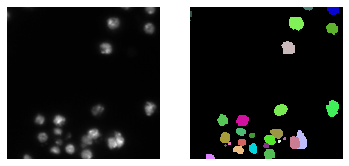

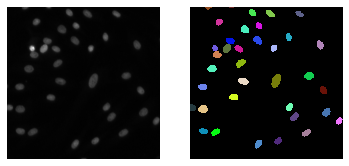

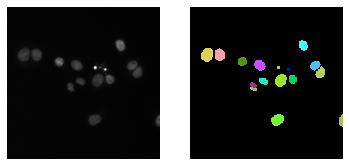

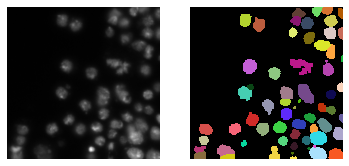

In [196]:
# plot the first 4 images
for i in range(4):
    plot_sample(image_paths[i], mask_paths[i])

You should see 4 images with nuclei and the corresponding colored nuclei masks. To further understand and explain the data, please answer the following QUESTIONS:
- Do the ids assigned to the individual nuclei (= colors in the 2nd column of images) have a fixed meaning? In other words, would the segmentation change if we change shuffle these numbers, so that all pixels labeled `1` are labeled `2` and so on?
    - no they dont have a fixed meaning or any order. The segmentation *should* be the same.
- Can we directly use a U-Net to predict the mask ids? Why / Why not?
    - No, with this segmentation representation we dont have a good loss function, since swapping of the labels should result in the same loss, but it will lead to different losses using this architecture.
- Find the unique shapes of the images in the training set.
- Do all images have the same shape? If not, can this lead to problems? How could we deal with potentially arising problems?
    - no they have different shapes. This could lead to problems in the train phase, but also later at inference.
    - to fix that problem, one could define a fixed shape, and convert every deviating input to that shape.

In [197]:
# TODO find how many images we have in the training set
print(len(image_paths),"many images")
# and find all (unique) shapes of the images in the training set
shapes = []
for path in image_paths:
    img = imageio.imread(path)
    array = np.asarray(img)
    if(array.shape not in shapes):
        shapes.append(array.shape)
print("shapes:",*shapes)

447 many images
shapes: (256, 256) (360, 360) (260, 347) (520, 696) (512, 640) (256, 320)


TODO your answer here

In [198]:
# TODO now load the images and masks into memory, and normalize the images so that they have zero mean and unit variance
images = [np.asarray(imageio.imread(path)) for path in image_paths]
masks = [np.asarray(imageio.imread(path)) for path in mask_paths]

In [199]:
ims_flat = np.concatenate([im.ravel() for im in images])
mean, std = np.mean(ims_flat), np.std(ims_flat)
images = [(im.astype("float32") - mean) / std for im in images]

In [200]:
# TODO make a train validation split, use every 20th image for validation
images_copy, mask_copy = images.copy(), masks.copy()
del images_copy[::20]
del mask_copy[::20]
train_images = images_copy
train_masks = mask_copy
val_images = images[::20]
val_masks = masks[::20]

In [201]:
len(train_images),len(val_images),len(images)

(424, 23, 447)

In [202]:
# finally, let's choose the appropriate torch device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

**Implement PyTorch dataset**

As a next step, we implement a `torch.utils.data.Dataset` to have access to our data during training. As you shoulf have realized in the previous question, the images in our training set come in different sizes. In order to concatenate batches, we however need images of the same size. To solve this issue, we will subsample patches of size 256 x 256 (smallest image size) from the images in the dataset.

In [203]:
class NucleiDataset(Dataset):
    def __init__(self, images, masks, image_transform=None, mask_transform=None, transform=None,expand=True):
        assert len(images) == len(masks)
        self.expand=expand
        self.images = images
        self.masks = masks
        self.image_transform = image_transform
        self.mask_transform = mask_transform
        self.transform = transform

    def __getitem__(self, index):
        image, mask = self.images[index], self.masks[index]

        # crop the images to have the shape 256 x 256, so that we can feed them into memory
        # despite them having different sizes
        crop_shape = (256, 256)
        shape = image.shape
        if shape != crop_shape:
            assert image.ndim == mask.ndim == 2
            crop_start = [np.random.randint(0, sh - csh) if sh != csh else 0 for sh, csh in zip(shape, crop_shape)]
            crop = tuple(slice(cs, cs + csh) for cs, csh in zip(crop_start, crop_shape))
            image, mask = image[crop], mask[crop]
              
        # apply the transforms if given
        if self.image_transform is not None:
            image = self.image_transform(image)
        if self.mask_transform is not None:
            mask = self.mask_transform(mask)
            if self.expand:
                mask = mask[np.newaxis,:,:] # add axis here
        if self.transform is not None:
            image, mask = self.transform(image, mask)
        
        # make sure we have numpy arrays and add a channel dimension for the image data
        image, mask = np.array(image), np.array(mask)
        if image.ndim == 2:
            image = image[None]
        return image, mask
        
    def __len__(self):
        return len(self.images)

As discussed in the lecture, we can't learn the instance segmentation directly. So we will first start with a semantic segmentation problem and learn foreground background segmentation with the U-Net, i.e. predict for each pixel whether it belongs to a nucleus or to the background. To this end, implement a `mask_transform` that converts the instance segmentation ground-truth into a binary target and pass it to the training dataset.

In [204]:
len(train_masks)

424

In [205]:
# TODO implement a transform that outputs the binary target 
# and instantiate the training dataset and validation dataset with it
# HINT: the transform can be a function that takes the mask array as input and returns the binarized version
# HINT: you will also need to add a channel dimension to the target
to_binary = lambda x : 0 if x==0 else 1
to_binary = np.vectorize(to_binary)
train_dataset = NucleiDataset(train_images,train_masks,mask_transform=to_binary)
val_dataset = NucleiDataset(val_images,val_masks,mask_transform=to_binary)

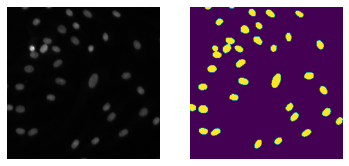

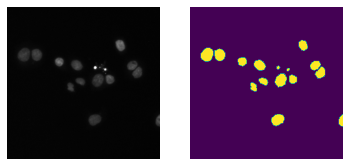

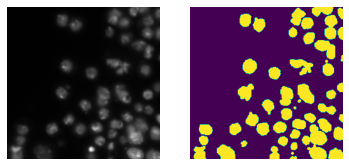

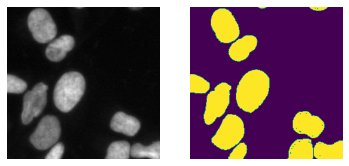

In [206]:
# TODO sample a few images from the dataset and verify that they are correct
def plot1(image, mask):
    fig, ax = plt.subplots(1, 2)
    ax[0].axis("off")
    ax[0].imshow(image, cmap="gray")
    # visualize the masks with random colors
    ax[1].axis("off")
    ax[1].imshow(mask)
    plt.show()
data = iter(train_dataset)
for i in range(4):
    image,mask = next(data)
    plot1(image[0], mask[0])

The images you sample should look similar to this (using the standard colormap for the binarized mask):

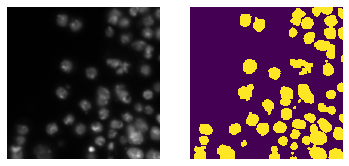



Next, we will implement a U-Net architecture inspired [Ronneberger et al.](https://arxiv.org/abs/1505.04597), see the image below.

IMPORTANT: unlike in the publication / image we will use SAME convolutions, so that the input shape is the same as the output shape. This will introduce some boundary artifacts, but it will make implementing the rest of this exercise much simpler.
It also means that you don't need to crop the features passed on in the skip connections and can directly concatenate them.

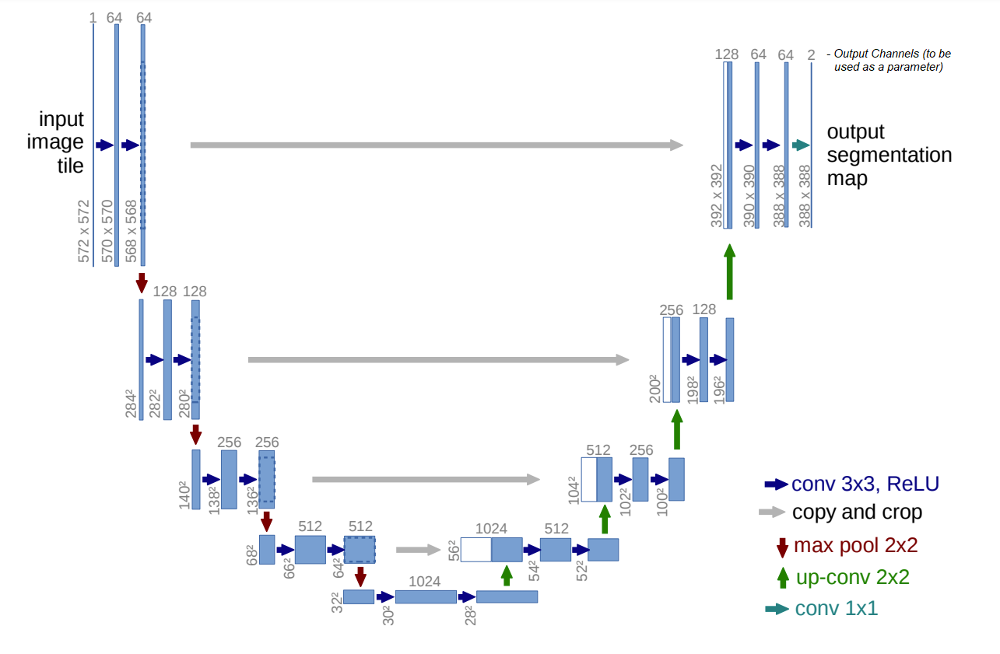

HINTS: 
- the `up-conv` used here is called [ConvTranspose2d](https://pytorch.org/docs/stable/generated/torch.nn.ConvTranspose2d.html#convtranspose2d) in PyTorch.
- you can concatenate the features coming from the skip connectins and the encoder with `torch.cat`
- you will need `nn.ModuleList` to store the individual blocks of the encoder / decoder

Before you implement the U-Net, please answer the following QUESTIONS:
- What kind of architecture is the U-Net and what is the rationale behind this architecture?
    - CNN without FC Layer. Has contraction and expansion part, which allows to gain semantic information
- What other types of architectures for semantic segmentation exist to achieve similar effects?
    - DeepLab 
- Why are the skip connections used in the U-Net?
    - The are used to keep high resulution, which can be lost after contraction

TODO your answers here

In [243]:
# TODO implement the U-Net architecture
class Encoder(nn.Module):
    def __init__(self, in_channels=1,mode='down',first=False,batch_norm=False):
        super().__init__()
        if first:
            between_channel= 64
        else:
            if mode == 'down':                    
                between_channel=in_channels*2
            elif mode == 'up':
                between_channel=in_channels//2
            else:
                print("error")
        self.inc = in_channels
        self.out = between_channel
        self.mode = mode
        if batch_norm:
            block = [nn.Conv2d(in_channels, between_channel, 3, padding='same'),
                     nn.BatchNorm2d(between_channel),
                     nn.ReLU(),
                     nn.Conv2d(between_channel, between_channel, 3, padding='same'),
                     nn.BatchNorm2d(between_channel),
                     nn.ReLU()]            
        else:
            block = [nn.Conv2d(in_channels, between_channel, 3, padding='same'),
                     nn.ReLU(),
                     nn.Conv2d(between_channel, between_channel, 3, padding='same'),
                     nn.ReLU()]
        self.enc = nn.Sequential(*block)
    def forward(self, x):
        #print("in:",self.inc,"\tout:",self.out,"\tmode:",self.mode) #debugging
        return self.enc(x)
        
class Decoder(nn.Module):
    def __init__(self, in_channels=1024,batch_norm = False):
        super().__init__()
        between_channel=in_channels//2
        self.up_conv = nn.ConvTranspose2d(in_channels, between_channel, 2, stride=2)
        if batch_norm:
            self.conv_block = Encoder(in_channels,mode='up',batch_norm=True)
        else:
            self.conv_block = Encoder(in_channels,mode='up')
    def forward(self,x,skipped):
        x = self.up_conv(x)
        x = torch.cat((skipped,x),dim=-3)
        #print(x.shape)
        x = self.conv_block(x)
        return x
        
class UNet(nn.Module):
    def __init__(self, in_channels=1, out_channels=1,depth=5,batch_norm=False):
        super(UNet, self).__init__()
        self.depth = depth
        self.encode_path = nn.ModuleList()
        prev_channel = in_channels
        for i in range(depth):
            if i == 0:
                if batch_norm:
                    self.encode_path.append(Encoder(prev_channel,first=True,batch_norm=True))
                else:
                    self.encode_path.append(Encoder(prev_channel,first=True))
                prev_channel = 64
            else:
                if batch_norm:
                    self.encode_path.append(Encoder(prev_channel,batch_norm=True))
                else:
                    self.encode_path.append(Encoder(prev_channel))
                prev_channel*=2
        self.decode_path = nn.ModuleList()
        
        for i in range(depth-1):
            #print(prev_channel)
            if batch_norm:
                self.decode_path.append(Decoder(in_channels=prev_channel,batch_norm=True))
            else:
                self.decode_path.append(Decoder(in_channels=prev_channel))
            prev_channel=prev_channel//2
        self.final_conv = nn.Conv2d(64,out_channels,1)
            
    def forward(self,x):
        save = []
        for i,enc in enumerate(self.encode_path):
            x = enc(x)
            if(i!=self.depth-1):
                save.append(x)
                x = F.max_pool2d(x,2)
        for j,dec in enumerate(self.decode_path):
            x = dec(x,save[-j-1])
        x = self.final_conv(x)
        return x
            

In [208]:
# TODO instantiate a unet and check that your architecture is correct by applying it to
# an input from the train loader
model = UNet().eval()

In [209]:
# TODO display the prediction. Can you interpret the resulting image?
image,mask = next(iter(train_dataset))
pred = model(torch.tensor(image))

In [22]:
pred1 = pred[0].detach().numpy()

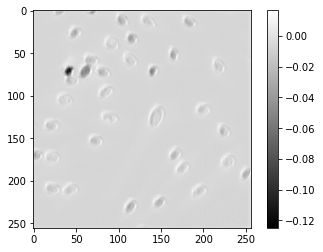

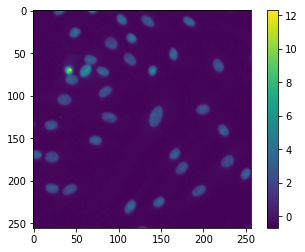

In [23]:
plt.imshow(pred1,cmap='gray')
plt.colorbar()
plt.show()
plt.imshow(image[0])
plt.colorbar()

## Training

Now we can define the training functions, similar to the last exercise, and then plot the results of loss and metrics

## Discussion:
Another way to monitor the loss, metrics and images during training and validation is [tensorboard](https://www.tensorflow.org/tensorboard). Note that usually the data for tensorboard is stored separately from the notebook files/scripts, so if you copy the scripts somewhere else you will not see the curves in tensorboard anymore.

In [126]:
# in this cell all the training and validation functions are implemented for you already;
# these implementations are fairly similar to the exercise where we trained a CNN on CIFAR

# normalize a tensor to range [0, 1] (per channel).
# this is needed to properly display the tensor as an image in tensorboard
def normalize(tensor):
    eps = 1e-6
    normed = tensor.numpy()
    minval = normed.min(axis=(0, 2, 3), keepdims=True)
    normed = normed - minval
    maxval = normed.max(axis=(0, 2, 3), keepdims=True)
    normed = normed / (maxval + eps)
    return torch.from_numpy(normed)
# train the model for one epoch
def train_epoch(model, loader, loss, metric, optimizer):
    model.train()
    for i, (x, y) in enumerate(loader):
        optimizer.zero_grad()
        if(y.dim()==5):
            y = y[0]
        x, y = x.to(device,dtype=torch.float), y.to(device,dtype=torch.float)
        pred = model(x)
        loss_value = loss(pred, y.float()) #added float
        loss_value.backward()
        optimizer.step()
        if metric is not None:
            metric_value = metric(pred, y)


# validate the model
def validate(model, loader, loss, metric):
    model.eval()
    n_val = len(loader)
    metric_value, loss_value = 0.0, 0.0
    with torch.no_grad():
        for x, y in loader:
            x, y = x.to(device), y.to(device)
            pred = model(x.float()) #add float
            if(y.dim()==5):
                y = y[0]
            loss_value += loss(pred, y.float()).item() 
            if metric is not None:
                metric_value += metric(pred, y).item()
        
    metric_value /= n_val
    loss_value /= n_val
    if loss.__class__.__name__ is not None:
        loss_type = loss.__class__.__name__
        print(f"{loss_type}:",loss_value,"\tMetric:",metric_value)  
    else:
        print("Loss:",loss_value,"\tMetric:",metric_value)

# run the whole training
def run_training(
    model, train_loader, val_loader, loss, metric, optimizer, n_epochs
):
    epoch_len = len(train_loader)
    step = 0
    for epoch in tqdm.trange(n_epochs):
        print("Epoch:",epoch)
        train_epoch(model, train_loader, loss, metric, optimizer)
        step = epoch_len * (epoch + 1)
        validate(model, val_loader, loss, metric)

We will use (per-pixel) binary cross entropy as a loss function. Pytorch offers to different implementations of this loss: [BCELoss](https://pytorch.org/docs/stable/generated/torch.nn.BCELoss.html) and [BCEWithLogitsLoss](https://pytorch.org/docs/stable/generated/torch.nn.BCEWithLogitsLoss.html).

HINTS:
- The targets for BCE should be 'float32' values

QUESTIONS:
- What is the difference between the two different implementations?
- Which one do we need to use here, and why?

TODO your answers here
- the difference is, that in BCEwithlogits a sigmoid function is applied directly on the prediction to make use of log-sum-exp trick for numerical stability.
    - prevents over/underflow error

In [25]:
# TODO create the loss function
loss = nn.BCEWithLogitsLoss()

Next, we want to define a suitable metric for measuring the quality of the (binary) network prediction. We will use the [dice score](https://en.wikipedia.org/wiki/S%C3%B8rensen%E2%80%93Dice_coefficient) for this, which compares the intersection of prediction and target to their union.

In [26]:
# TODO implement the dice score as a function.
# HINTS: 
# - for later parts of this exercises, you should implement it in such a way that
# the function can compute the dice score for input and target with multiple channels,
# and so that it is computed independently per channel and the channel average is returned
# - since we don't have an activation in the U-Net you need to bring the predictions in range [0, 1] using torch.sigmoid
# - the dice score can be formulated for continuous predictions in [0, 1]; DO NOT threshold the predictions
def dice_score(input_, target):
    input_ = input_.detach()
    target = torch.tensor(target)
    inp = torch.sigmoid(input_)
    summe = torch.sum(inp*target,(-2,-1))
    dice = summe/(torch.sum(inp,(-2,-1))+torch.sum(target,(-2,-1)))
    return dice.mean()

In [27]:
# TODO check your dice implementation for an example model prediction and the corresponding target
dice_score(pred,mask)

tensor(0.0630)

In [28]:
# train the model for 10 epochs, 
# after the training, check the plots to see how the model loss and metrics evolve,
# and to see predictions of the training data in real time
n_epochs = 10
model = UNet().to(device)
train_loader = DataLoader(train_dataset, batch_size=1, shuffle=True) 
val_loader = DataLoader(val_dataset, batch_size=1)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
run_training(model, train_loader, val_loader, loss, dice_score, optimizer, n_epochs)

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 0


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:10: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  # Remove the CWD from sys.path while we load stuff.
 10%|█         | 1/10 [00:43<06:28, 43.16s/it]

Loss: 0.1324042899372137 	Metric: 0.331231577888779
Epoch: 1


 20%|██        | 2/10 [01:16<05:01, 37.63s/it]

Loss: 0.10088853092621201 	Metric: 0.378385946802471
Epoch: 2


 30%|███       | 3/10 [01:51<04:13, 36.26s/it]

Loss: 0.11111799562754839 	Metric: 0.34134590949701227
Epoch: 3


 40%|████      | 4/10 [02:27<03:36, 36.00s/it]

Loss: 0.11560940604818903 	Metric: 0.3696299020362937
Epoch: 4


 50%|█████     | 5/10 [03:02<02:59, 35.84s/it]

Loss: 0.08746609427844701 	Metric: 0.3831939425157464
Epoch: 5


 60%|██████    | 6/10 [03:38<02:22, 35.70s/it]

Loss: 0.08251855615526438 	Metric: 0.4041327477797218
Epoch: 6


 70%|███████   | 7/10 [04:13<01:46, 35.60s/it]

Loss: 0.09456064058062823 	Metric: 0.3422424112973006
Epoch: 7


 80%|████████  | 8/10 [04:48<01:11, 35.56s/it]

Loss: 0.05572412711689654 	Metric: 0.4260256173818008
Epoch: 8


 90%|█████████ | 9/10 [05:24<00:35, 35.51s/it]

Loss: 0.054179898503681885 	Metric: 0.4197065208269202
Epoch: 9


100%|██████████| 10/10 [05:59<00:00, 36.00s/it]

Loss: 0.05393038675917879 	Metric: 0.4135518423888994


## Evaluate on test data

Now, we will evaluate the **instance segmentation**  derived from the model predictions on the test data. To this end, we will use [connected components](https://en.wikipedia.org/wiki/Component_(graph_theory)#Algorithms) to convert the (binarized) network predictions into an instance segmentation. We will use the implementation from [skimage](https://scikit-image.org/docs/dev/api/skimage.measure.html#skimage.measure.label).

QUESTION:
- Describe briefly what the connected components algorithm does when applied to a (binary) image. (You don't need to comment on the 'how' (implementation)).
- Answer: For every connected point it gives the same label (from 0 to n). Conneted points are points that have the same value and are neigbours.

TODO: 

In [37]:
image_paths = glob(os.path.join(data_folder, "test", "images", "*.tif"))
image_paths.sort()
mask_paths = glob(os.path.join(data_folder, "test", "masks", "*.tif"))
mask_paths.sort()
test_images = [np.asarray(imageio.imread(path)) for path in image_paths]
test_masks = [np.asarray(imageio.imread(path)) for path in mask_paths]
test_ims_flat = np.concatenate([im.ravel() for im in test_images])
mean, std = np.mean(test_ims_flat), np.std(test_ims_flat)
test_images = [(im.astype("float32") - mean) / std for im in test_images]

In [38]:
# TODO load and normalize the test images
#test_masks = [to_binary(mask) for mask in test_masks]
test_dataset = NucleiDataset(test_images,test_masks,mask_transform=to_binary)

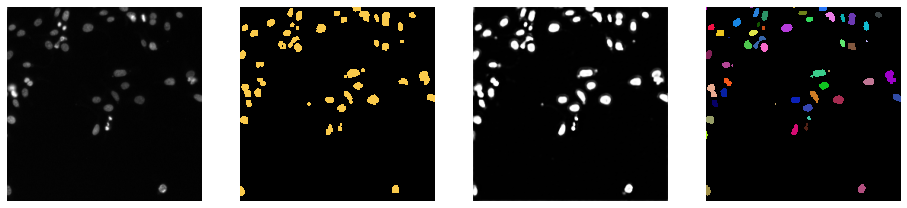

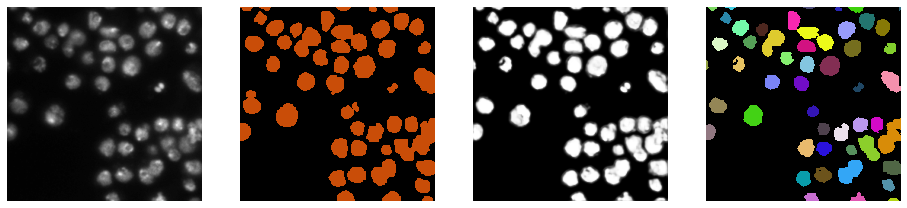

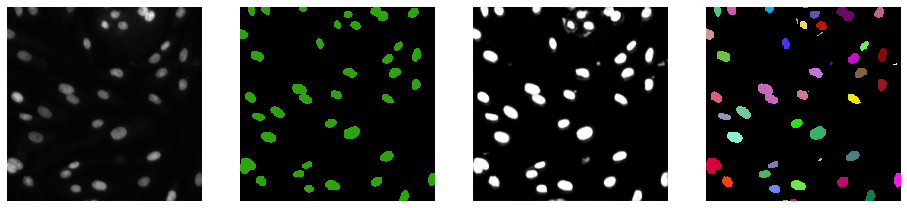

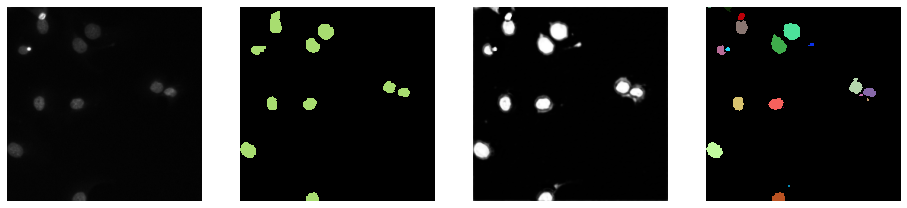

In [44]:
# check out instance segmentation for a few test images
counter = 0
with torch.no_grad():
    for im, mask in test_dataset:
        if counter > 3:
            break
        # predict with the model and apply sigmoid to map the prediction to the range [0, 1]
        pred = model(1.0*torch.from_numpy(im).to(device))
        pred = torch.sigmoid(pred).cpu().numpy().squeeze()
        # get tbe nucleus instance segmentation by applying connected components to the binarized prediction
        nuclei = label(pred > 0.5)
        fig, ax = plt.subplots(1, 4, figsize=(16, 16))
        ax[0].axis("off")
        ax[0].imshow(im[0], cmap="gray")
        ax[1].axis("off")
        ax[1].imshow(mask[0], cmap=get_random_colors(mask), interpolation="nearest")
        ax[2].axis("off")
        ax[2].imshow(pred, cmap="gray")
        ax[3].axis("off")
        ax[3].imshow(nuclei, cmap=get_random_colors(nuclei), interpolation="nearest")
        plt.show()
        counter += 1

In [45]:
# we also need a measure for the instance segmentation quality.
# here, we use intersection over union (for each ground-truth object).
# it is implemented for you already below

def precision(tp, fp, fn):
    return tp / (tp + fp) if tp > 0 else 0


def compute_ious(seg, mask):
    overlap = contingency_table(seg, mask).toarray()
    n_pixels_pred = np.sum(overlap, axis=0, keepdims=True)
    n_pixels_true = np.sum(overlap, axis=1, keepdims=True)
    eps = 1e-7
    ious = overlap / np.maximum(n_pixels_pred + n_pixels_true - overlap, eps)
    # ignore matches with zero (= background)
    ious = ious[1:, 1:]
    n_pred, n_true = ious.shape
    n_matched = min(n_pred, n_true)
    return n_true, n_matched, n_pred, ious

    
def compute_tps(ious, n_matched, threshold):
    not_trivial = n_matched > 0 and np.any(ious >= threshold)
    if not_trivial:
        # compute optimal matching with iou scores as tie-breaker
        costs = -(ious >= threshold).astype(float) - ious / (2*n_matched)
        pred_ind, true_ind = linear_sum_assignment(costs)
        assert n_matched == len(true_ind) == len(pred_ind)
        match_ok = ious[pred_ind, true_ind] >= threshold
        tp = np.count_nonzero(match_ok)
    else:
        tp = 0
    return tp


def intersection_over_union(seg, mask, threshold=0.5):
    if seg.sum() == 0:
        return 0.0
    n_true, n_matched, n_pred, ious = compute_ious(seg, mask)
    tp = compute_tps(ious, n_matched, threshold)
    fp = n_pred - tp
    fn = n_true - tp
    ap = precision(tp, fp, fn)
    return ap

In [52]:
# Compute the average IOU of all the test images
ious = []
model.eval()
with torch.no_grad():
    for im, mask in tqdm.tqdm(zip(test_images, test_masks), total=len(test_images)):
        # the model can only predict images with a spatial size that is divisible by 16
        # if it isn't we just cat a few pixels to make it fit
        if any(sh % 16 != 0 for sh in im.shape):
            crop = tuple(
                slice(0, -(sh%16)) for sh in im.shape
            )
            im = im[crop]
            mask = mask[crop]
        input_ = 1.0*torch.from_numpy(im[None, None]).to(device)
        pred = model(input_)
        pred = torch.sigmoid(pred).cpu().numpy().squeeze()
        labels = label(pred > 0.5)
        
        iou = intersection_over_union(labels, mask)
        ious.append(iou)
print()
print("Mean IoU:", np.mean(ious))

100%|██████████| 50/50 [00:02<00:00, 18.54it/s]


Mean IoU: 0.7105805272686598


QUESTION:
- Given the samples of the instance segmentations from above, what are the biggest sources of error you can identify in the model predictions / instance segmentation approach?
- How could they be overcome?

TODO your answer here
- close nuclei are hard to distinguish for the model
- it would help to have some boundaries for those close cells in training to tell the model how to divide them


## Train with boundary channel

To avoid merges of touching nuclei, we will now add a boundary channel to the learning objective, and then use it for object separation in the instance segmentation funtion. To this end, we will train a U-Net that outputs 3 channels (background, foreground, object boundary) and use the cross entropy loss.

In [54]:
# TODO implement a transform that outputs an image with 3 values:
# 0 for backgorund, 1 for foreground (= nucleus) and 2 for boundary (boundary pixel between nucleus and background or between 2 nuclei)
# HINT: you can use skimage.segmentation.find_boundaries (already imported) to determine the boundary pixels
def label_transform(mask):
    t = mask.copy()
    t[t!=0]=1
    bound = find_boundaries(mask)
    t[bound]=2
    return np.array(t,dtype="float32")

In [55]:
# TODO implement a transform that outputs an image with 3 values:
# 0 for backgorund, 1 for foreground (= nucleus) and 2 for boundary (boundary pixel between nucleus and background or between 2 nuclei)
# HINT: you can use skimage.segmentation.find_boundaries (already imported) to determine the boundary pixels
def label_transform_3_channel(mask): #otherwise its not trainable
    t = mask.copy()
    arr = np.zeros((3,*mask.shape))
    #arr[0]=[t==0]
    arr[0]=np.array([t==0]).reshape((256,256))
    arr[1]=np.array([t!=0]).reshape((256,256))
    bound = find_boundaries(t)
    arr[2]=1.0*bound
    return np.array(arr,dtype="float32")

In [56]:
# instantiate the training and validation datasets with the new label transform
train_dataset = NucleiDataset(
    train_images, train_masks, mask_transform=label_transform_3_channel
)
val_dataset = NucleiDataset(
    val_images, val_masks, mask_transform=label_transform_3_channel
)

(256, 256)


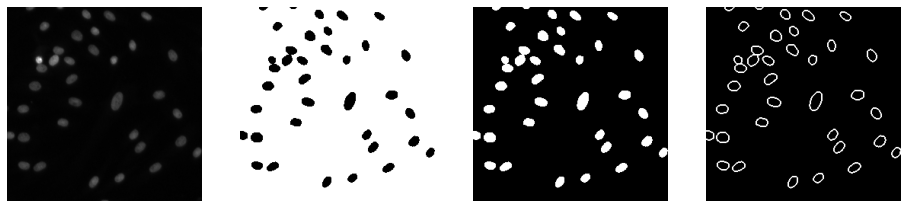

(256, 256)


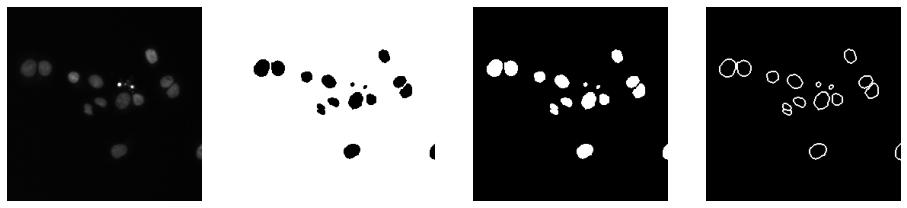

(256, 256)


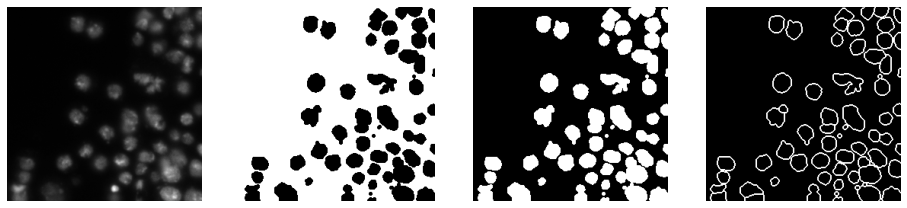

(256, 256)


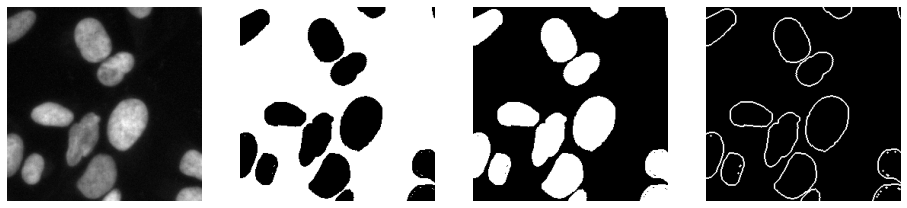

In [57]:
# visualize the new label transform and make sure it's correct
import matplotlib
counter = 0
for im, target in train_dataset:
    if counter > 3:
        break
    fig, ax = plt.subplots(1, 4, figsize=(16, 16))
    ax[0].axis("off")
    print(im[0].shape)
    ax[0].imshow(im[0], cmap="gray")
    ax[1].axis("off")
    ax[1].imshow(target[0][0],"gray")
    ax[2].axis("off")
    ax[2].imshow(target[0][1],"gray")
    ax[3].axis("off")
    ax[3].imshow(target[0][2],"gray")
    plt.show()
    counter += 1

In [58]:
# TODO instantiate the new unet and loss function
model = UNet(out_channels=3).to(device)
loss  = nn.CrossEntropyLoss()

In [59]:
# train the new U-Net for 10 epochs
# (we don't use a metric here, since the target (with class labels 0, 1, 2) and prediction (one-hot encoding) have different representations
n_epochs = 10
train_loader = DataLoader(train_dataset, batch_size=1, shuffle=True) 
val_loader = DataLoader(val_dataset, batch_size=1)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
metric = None
run_training(model, train_loader, val_loader, loss, metric, optimizer, n_epochs)

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 0


 10%|█         | 1/10 [00:34<05:13, 34.80s/it]

CrossEntropyLoss: 0.2254972344507342 	Metric: 0.0
Epoch: 1


 20%|██        | 2/10 [01:10<04:42, 35.27s/it]

CrossEntropyLoss: 0.20208761983794038 	Metric: 0.0
Epoch: 2


 30%|███       | 3/10 [01:46<04:08, 35.52s/it]

CrossEntropyLoss: 0.15051906385823435 	Metric: 0.0
Epoch: 3


 40%|████      | 4/10 [02:21<03:33, 35.52s/it]

CrossEntropyLoss: 0.1455528856781514 	Metric: 0.0
Epoch: 4


 50%|█████     | 5/10 [02:57<02:57, 35.57s/it]

CrossEntropyLoss: 0.14322379312437514 	Metric: 0.0
Epoch: 5


 60%|██████    | 6/10 [03:33<02:22, 35.59s/it]

CrossEntropyLoss: 0.13249177226553793 	Metric: 0.0
Epoch: 6


 70%|███████   | 7/10 [04:08<01:46, 35.58s/it]

CrossEntropyLoss: 0.14020682604092619 	Metric: 0.0
Epoch: 7


 80%|████████  | 8/10 [04:44<01:11, 35.57s/it]

CrossEntropyLoss: 0.13456721482393535 	Metric: 0.0
Epoch: 8


 90%|█████████ | 9/10 [05:19<00:35, 35.58s/it]

CrossEntropyLoss: 0.1254724629385316 	Metric: 0.0
Epoch: 9


100%|██████████| 10/10 [05:55<00:00, 35.53s/it]

CrossEntropyLoss: 0.11636059512586697 	Metric: 0.0


In [60]:
# TODO write instance segmentation function where you first subtract the  boundary from the foreground prediction,
# and then apply connected components to the result in order to get the instances
# the parameter 'threshold' should determine at which threshold the result is binarized before applying connected components 
# HINT: you can use skimage.segmentation.watershed (already implemented) afterwards to grow the segmentation back so that it
# covers the full prediction while keeping the instance labels
def instance_segmentation(foreground_prediction, boundary_prediction, threshold=0.5):
    #print(np.unique(diff).max())
    foreground_prediction = foreground_prediction.cpu().detach().numpy()
    boundary_prediction = boundary_prediction.cpu().detach().numpy()
    foreground_prediction = foreground_prediction - boundary_prediction
    binary_prediction = np.where(foreground_prediction > threshold, 1, 0)
    connected_components = label(binary_prediction)
    segmentation = watershed(-1*foreground_prediction, connected_components, mask=binary_prediction)
    return segmentation
    

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:14: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  


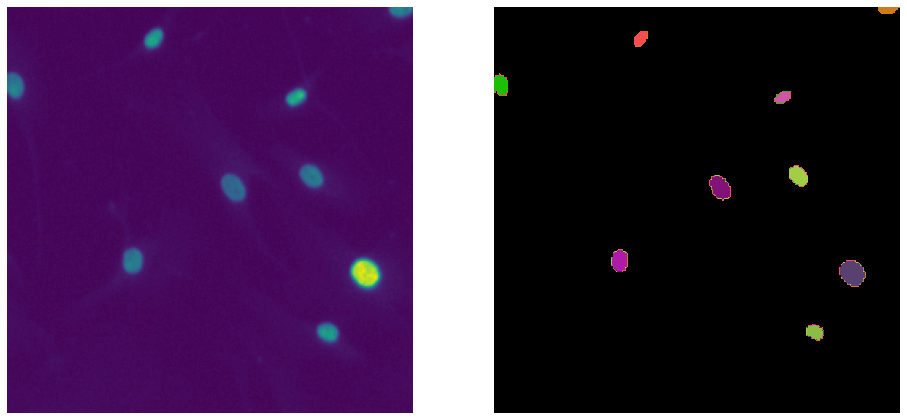

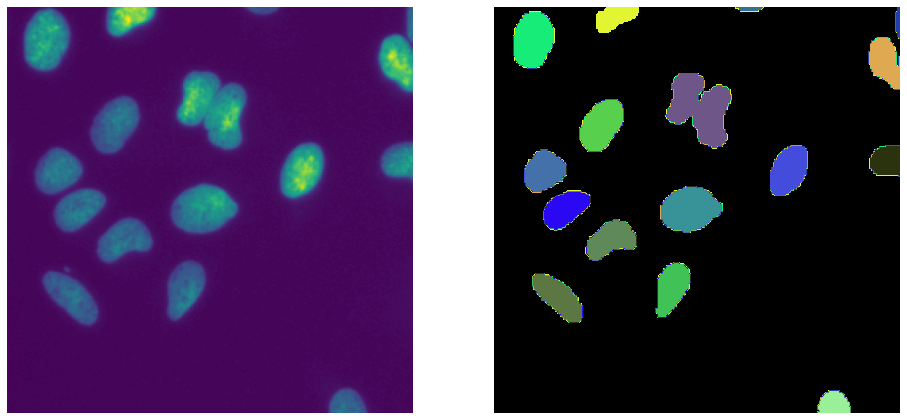

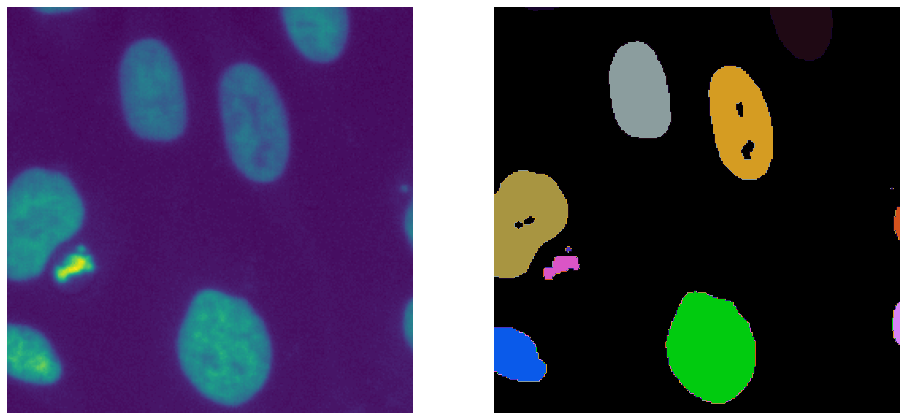

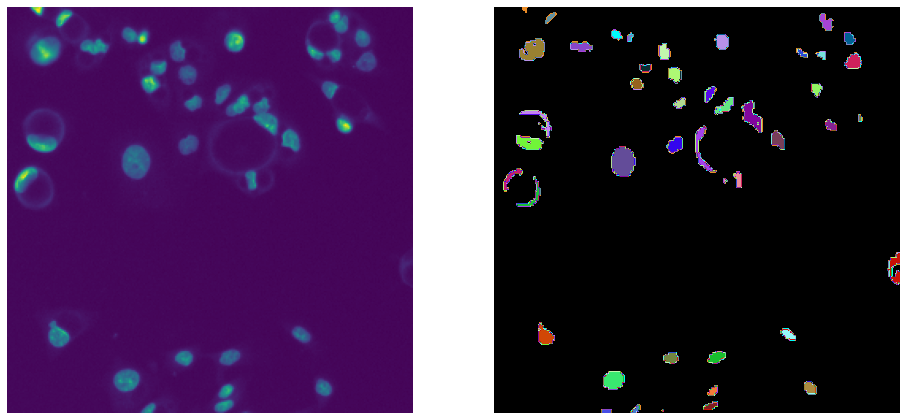

In [61]:
# TODO check the prediction results and instance segmentation for a few images
# make sure your instance segmentation implementation is correct
# HINT: you need to apply a softmax to the network predictions
import matplotlib
for i,(im, target) in enumerate(train_loader):
    if(i>3):
        break
    model.eval()
    pred = model(im.to(device))
    fig, ax = plt.subplots(1, 2, figsize=(16, 16))
    ax[0].axis("off")
    ax[0].imshow(im[0][0])
    m = nn.Softmax()
    pred = m(pred)[0]
    out = instance_segmentation(pred[1],pred[2],threshold=.5)
    ax[1].axis("off")
    ax[1].imshow(out,cmap=get_random_colors(out))

In [63]:

model.eval()
thresholds = np.zeros((100,2))
val_dataset = NucleiDataset(val_images,val_masks,mask_transform=label_transform_3_channel)
val_loader = DataLoader(val_dataset, batch_size=1)
m = nn.Softmax()
for i,lamda in enumerate(np.linspace(0,1,100)):
    ious = []
    with torch.no_grad():
        for im, mask in val_loader:
            mask = mask.reshape(3,256,256)
            pred = model(im.to(device))
            pred = m(pred).reshape(3,256,256)
            pred_inst = instance_segmentation(pred[1],pred[2],threshold=lamda)
            target_inst = instance_segmentation(mask[1],mask[2],threshold=lamda)
            iou = intersection_over_union(pred_inst, target_inst)
            ious.append(iou)
    thresholds[i][0]=np.mean(ious)
    thresholds[i][1]=lamda
    #print(f"Mean IoU for threshhold lambda={lamda}:",np.mean(ious))

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:12: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  if sys.path[0] == "":


In [64]:
val_masks=[mask*1.0 for mask in val_masks]

In [211]:
# TODO use the validation set to find a good value for the 'threshold' parameter in the instance_segmentation function
argmax = thresholds[:,0].argmax()
best_threshold = thresholds[argmax][1]
print("best_threshold:",best_threshold,"with score:",thresholds[argmax][0])

best_threshold: 0.4545454545454546 with score: 0.7688179869332461


In [212]:
image_paths = glob(os.path.join(data_folder, "test", "images", "*.tif"))
image_paths.sort()
mask_paths = glob(os.path.join(data_folder, "test", "masks", "*.tif"))
mask_paths.sort()
test_images = [np.asarray(imageio.imread(path)) for path in image_paths]
ims_flat = np.concatenate([im.ravel() for im in test_images])
mean, std = np.mean(ims_flat), np.std(ims_flat)
test_images = [(im.astype("float32") - mean) / std for im in test_images]
test_masks = [np.asarray(imageio.imread(path)) for path in mask_paths]
test_dataset = NucleiDataset(test_images,test_masks,mask_transform=label_transform_3_channel)

In [67]:
# Compute the average IOU of all the test images
ious = []
model.eval()
with torch.no_grad():
    for im, mask in tqdm.tqdm(test_dataset):
        mask = torch.from_numpy(mask.reshape(3,256,256))
        pred = model(1.0*torch.tensor(im).to(device))
        pred = m(pred).reshape(3,256,256)      
        assert pred.shape[0] == 3
        
        pred_inst = instance_segmentation(pred[1],pred[2],threshold=0.5)
        target_inst = instance_segmentation(mask[1],mask[2],threshold=0.5)
        iou = intersection_over_union(pred_inst,target_inst,best_threshold)
        ious.append(iou)
print(np.mean(ious))

  0%|          | 0/50 [00:00<?, ?it/s]/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  
100%|██████████| 50/50 [00:01<00:00, 30.81it/s]

0.7865504232849281


QUESTIONS:
- Did training with the boundaries and using them in the instance segmentation improve the results?
- Can you think of ways to improve the loss function for this learning task?

TODO your answers here
- Yes it improved the results a lot
- The dice coefficient, since it values the background less, Focal Loss


## [Optional] Use the dice coefficient as loss function

Since our target is quite unbalanced (in particular the boundary channel), it can be benificial to use a balanced loss function. Here, we will use the Dice coefficient, which we have before used as metric, as loss function, since it is robust against unbalanced targets.
Note that we do not need to predict a channel with background prediction when using the dice coefficient as a loss (unlike with Cross Entropy).

In [106]:
# TODO implement a loss function based on the dice coefficient
# HINT: the dice coefficient is in range [0, 1] and higher values correspond to a better result
# Loss functions are minimized, so lower values should correspond to a better result
def inv_dice_score(input_, target):
    input_ = input_
    target = torch.tensor(target)
    inp = torch.sigmoid(input_)
    summe = torch.sum(inp*target,(-2,-1))
    dice = summe/(torch.sum(inp,(-2,-1))+torch.sum(target,(-2,-1)))
    return 1-dice.mean()
loss = inv_dice_score
inv_dice_score.__name__ = "Inverse Dice Score"

In [107]:
def label_transform_2_channel(mask):
    t = mask.copy()
    arr = np.zeros((2,*mask.shape))
    #arr[0]=[t==0]
    arr[0]=np.array([t!=0]).reshape((256,256))
    bound = find_boundaries(t)
    arr[1]=1.0*bound
    return np.array(arr,dtype="float32")

In [213]:
train_dataset_2 = NucleiDataset(
    train_images, train_masks, mask_transform=label_transform_2_channel
)
val_dataset_2 = NucleiDataset(
    val_images, val_masks, mask_transform=label_transform_2_channel
)

In [109]:
# TODO implement and compare with different loss function variations
model = UNet(out_channels=2).to(device)
n_epochs = 10
train_loader_2 = DataLoader(train_dataset_2, batch_size=1, shuffle=True) 
val_loader_2 = DataLoader(val_dataset_2, batch_size=1)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
metric = None
run_training(model, train_loader_2, val_loader_2, loss, metric, optimizer, n_epochs)

  0%|          | 0/10 [00:00<?, ?it/s]/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  


Epoch: 0


 10%|█         | 1/10 [00:36<05:26, 36.24s/it]

Inverse Dice Score: 0.7035732476607613 	Metric: 0.0
Epoch: 1


 20%|██        | 2/10 [01:11<04:46, 35.86s/it]

Inverse Dice Score: 0.6944998528646387 	Metric: 0.0
Epoch: 2


 30%|███       | 3/10 [01:47<04:09, 35.64s/it]

Inverse Dice Score: 0.6722427606582642 	Metric: 0.0
Epoch: 3


 40%|████      | 4/10 [02:22<03:33, 35.56s/it]

Inverse Dice Score: 0.624798816183339 	Metric: 0.0
Epoch: 4


 50%|█████     | 5/10 [02:57<02:57, 35.47s/it]

Inverse Dice Score: 0.616239713585895 	Metric: 0.0
Epoch: 5


 60%|██████    | 6/10 [03:33<02:21, 35.39s/it]

Inverse Dice Score: 0.610049641650656 	Metric: 0.0
Epoch: 6


 70%|███████   | 7/10 [04:08<01:45, 35.31s/it]

Inverse Dice Score: 0.6063513652138088 	Metric: 0.0
Epoch: 7


 80%|████████  | 8/10 [04:43<01:10, 35.23s/it]

Inverse Dice Score: 0.6077075315558392 	Metric: 0.0
Epoch: 8


 90%|█████████ | 9/10 [05:18<00:35, 35.18s/it]

Inverse Dice Score: 0.612004948698956 	Metric: 0.0
Epoch: 9


100%|██████████| 10/10 [05:53<00:00, 35.36s/it]

Inverse Dice Score: 0.6030385908873185 	Metric: 0.0


## [Optional] Try variations of the UNet architecture

- add BatchNorm
- replace TransposedConvs with bilinear upsampling and 1x1 convs
- use residual blocks instead of the normal convolutional blocks

In [ ]:
# TODO implement and compare u-net architecture variations


## [Optional] Train with data augmentation

- rotations & flips
- noise augmentations (add gaussian noise and/or poisson noise)
- crop and resize

Hint: use the `image_transform` (noise augmentations) and `transform` (geometrical augmentations) argument of the `NucleiDataset`

In [ ]:
# TODO implement data augmentations and compare with training without augmentations

# Denoising with Noise2Noise

Here, we implement [Noise2Noise](https://arxiv.org/abs/1803.04189), which is a method to learn image denoising **without** ground-truth, by using a different noisy image as target. Note that we are re-using the same architecture as before, which is a bit different from the one used in the paper.

## Data Preparation

We use the [VSDR dataset](https://cv.snu.ac.kr/research/VDSR), which contains 'clean' (i.e. without noise) natural images.

In [110]:
# Download the VSDR data
!conda install -y gdown
!gdown --id 1hNB5_MkxutrKLa1g35tSLCiq1J5xxH9F --folder

os.makedirs("/kaggle/working/dlforcv-ex5", exist_ok=True)

!unzip "/kaggle/working/VDSR/train_data.zip" -d "dlforcv-ex5/vsdr_train"
!unzip "/kaggle/working/VDSR/test_data.zip" -d "dlforcv-ex5/vsdr_test"

Solving environment: done


==> WARNING: A newer version of conda exists. <==
  current version: 22.9.0
  latest version: 22.11.1

Please update conda by running

    $ conda update -n base -c conda-forge conda



## Package Plan ##

  environment location: /opt/conda

  added / updated specs:
    - gdown


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    faiss-proc-1.0.0           |             cuda          18 KB  conda-forge
    filelock-3.9.0             |     pyhd8ed1ab_0          13 KB  conda-forge
    gdown-4.6.0                |     pyhd8ed1ab_0          18 KB  conda-forge
    ------------------------------------------------------------
                                           Total:          49 KB

The following NEW packages will be INSTALLED:

  filelock           conda-forge/noarch::filelock-3.9.0-pyhd8ed1ab_0 None
  gdown              conda-forge/noarch::gdown-4.6.0-pyhd8ed1

In [111]:
# setting paths for the training and testing data
vsdr_train = "/kaggle/working/dlforcv-ex5/vsdr_train/"
vsdr_test = "/kaggle/working/dlforcv-ex5/vsdr_test/"

In [214]:
# check the unique image sizes in the training data
image_exts = (".jpeg", ".jpg", ".png", ".bmp")
all_image_paths = [
    p for p in Path(vsdr_test).glob("**/*") if p.suffix.lower() in image_exts
]
shapes = []
for p in all_image_paths:
    shapes.append(imageio.imread(p).shape)
unique_shapes = list(set(shapes))
print(unique_shapes)

[(769, 1024, 3), (344, 228, 3), (576, 1024, 3), (321, 481, 3), (665, 1024, 3), (480, 500, 3), (362, 500, 3), (689, 1024, 3), (644, 1024, 3), (1024, 685, 3), (391, 586, 3), (276, 276, 3), (766, 1024, 3), (819, 1024, 3), (672, 1024, 3), (737, 1024, 3), (692, 1024, 3), (1024, 742, 3), (694, 1024, 3), (1024, 683, 3), (1200, 798, 3), (576, 720, 3), (1024, 700, 3), (805, 1024, 3), (616, 1024, 3), (681, 1024, 3), (288, 352, 3), (512, 768, 3), (1024, 768, 3), (512, 512, 3), (256, 256, 3), (512, 512), (683, 1024, 3), (768, 1024, 3), (660, 1024, 3), (1024, 1024, 3), (481, 321, 3), (835, 1024, 3), (1037, 778, 3), (727, 1024, 3), (575, 1024, 3), (963, 1280, 3), (656, 529, 3), (1024, 1005, 3), (773, 1024, 3), (827, 1200, 3), (980, 1000, 3), (732, 1024, 3), (797, 1024, 3), (864, 1024, 3), (673, 1024, 3), (1024, 692, 3), (695, 1024, 3), (1024, 567, 3), (280, 280, 3), (361, 250, 3), (656, 1024, 3), (676, 1024, 3), (680, 1024, 3), (678, 1024, 3), (682, 1024, 3), (765, 1024, 3), (288, 288, 3)]


In [215]:
# vsdr dataset that can deal with all the different data sizes in the training and test data
class VsdrDataset(Dataset):
    def __init__(self, root_dir, noise_transform):
        image_exts = (".jpeg", ".jpg", ".png", ".bmp")
        self.image_paths = [
            p for p in Path(root_dir).glob("**/*") if p.suffix.lower() in image_exts
        ]
        self.noise_transform = noise_transform
    
    def __len__(self):
        return len(self.image_paths)
    
    def __getitem__(self, index):
        im = np.array(imageio.imread(self.image_paths[index]))
        if im.ndim == 2:
            im = np.concatenate([im[..., None]] * 3, axis=2)
        if im.shape[-1] == 1:
            im = np.concatenate([im] * 3, axis=2)
        target_shape = (256, 256)
        # first, pad the images if they are smaller than the target crop shape
        if any(sh < tsh for sh, tsh in zip(im.shape[:-1], target_shape)):
            padding = tuple((0, tsh - sh if sh < tsh else 0) for sh, tsh in zip(im.shape[:-1], target_shape))
            padding = padding + ((0, 0),)
            im = np.pad(im, padding, mode="reflect")
        # then crop tham if they are too large
        if any(sh > tsh for sh, tsh in zip(im.shape[:-1], target_shape)):
            crop_start = [np.random.randint(0, sh - tsh) if sh != tsh else 0 for sh, tsh in zip(im.shape[:-1], target_shape)]
            crop = tuple(slice(cs, cs + tsh) for cs, tsh in zip(crop_start, target_shape))
            im = im[crop]
        assert im.shape == (256, 256, 3), f"{im.shape}"
        
        # normalize the image to range [0, 1] (per channel)
        im = im.astype("float32")
        im -= im.min(axis=(0, 1), keepdims=True)
        im /= im.max(axis=(0, 1), keepdims=True)
        # bring image in range [-1, 1]
        im = 2 * im - 1
        
        # transform to channel first order
        im = im.transpose((2, 0, 1))
        # apply the noise transformation
        return self.noise_transform(im)

In [216]:
# go from range [-1, 1] to [0, 255] and uint 8
# and go to channel last order
def to_display(im):
    im = (((im + 1) / 2) * 255).astype("uint8")
    return im.transpose((1, 2, 0))

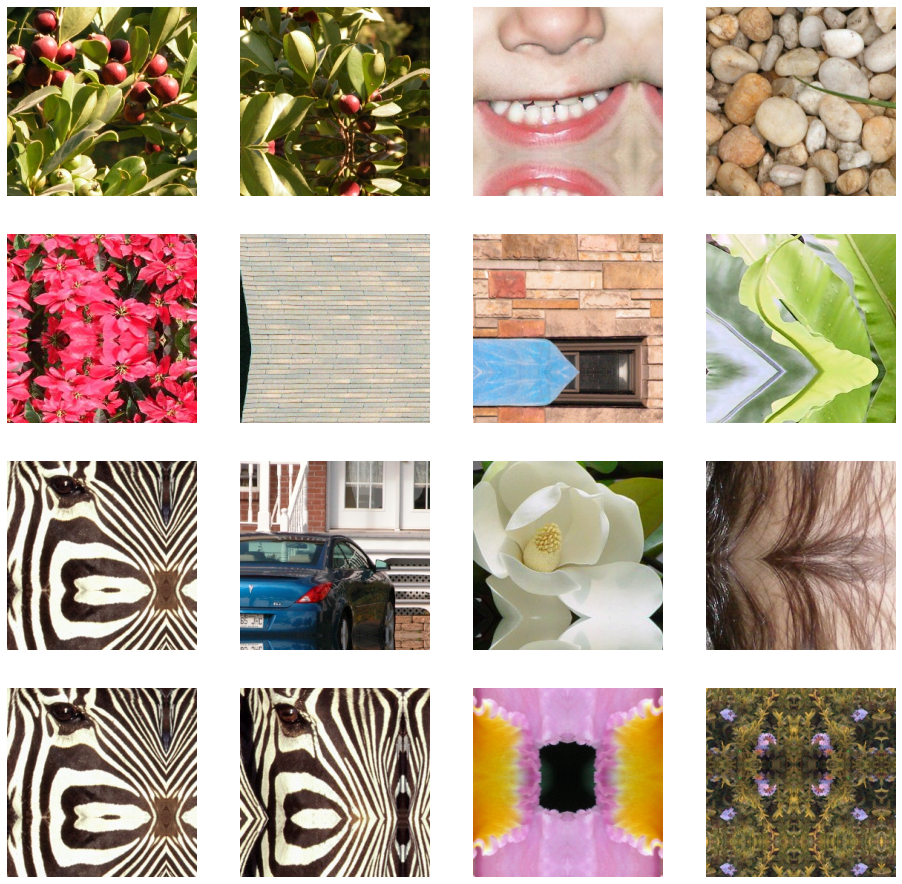

In [118]:
# sample a few images
check_dataset = VsdrDataset(vsdr_train, lambda x: x)
fig, ax = plt.subplots(4, 4, figsize=(16, 16))
for ii in range(16):
    im = check_dataset[ii]
    ax[ii % 4, ii // 4].axis("off")
    ax[ii % 4, ii // 4].imshow(to_display(im))
plt.show()

## Train a network with clean targets

As the first baseline, we will train a network with clean target data (i.e. without noise added to it). 

In [169]:
# instatiate the model and loss function (Mean Squared Error)
model = UNet(in_channels=3, out_channels=3)
model.to(device)
loss = nn.MSELoss()
loss.to(device)

MSELoss()

In [120]:
# we will use the PSNR (peak signal to noise ratio) as metric to evaluate the predictions.
# you can read up on it and the implementation we are using here:
# https://www.ni.com/en-us/innovations/white-papers/11/peak-signal-to-noise-ratio-as-an-image-quality-metric.html
# (the higher the PSNR, the better)

def to_uint8(im):
    return torch.clamp((im + 0.5) * 255.0 + 0.5, 0, 255).type(torch.uint8)


class PSNR(nn.Module):
    def __call__(self, x, y):
        x, y = to_uint8(x), to_uint8(y)
        x, y = x.detach().cpu().numpy(), y.detach().cpu().numpy()
        return peak_signal_noise_ratio(x, y)

QUESTION:
- What does the PSNR metric measuere?
- Why is it used instead of 'just' computing the pixel wise error (MSE)?

TODO your answer here
- it measures the ratio between the maximum peak signal (highest color value) and the noise ratio (mse), normalized with log10
- the higher the psnr, the better the reconstruction of the image
- its used instead of mse because it normalizes the error by the value range of the image, which helps to compare different images with different color ranges.

In [121]:
# TODO implement a function that adds additive gaussian noise to the input
# the var argument should correspond to the variance of the gaussian
def additive_gaussian_noise(x, var):
    added_gauss = random_noise(x,mode='gaussian',var=var)
    return added_gauss

In [217]:
DS = VsdrDataset(vsdr_train, lambda x: (additive_gaussian_noise(x,0.1),x))
train_size = int(0.9 * len(DS))
val_size = len(DS) - train_size
train_dataset, val_dataset = torch.utils.data.random_split(DS, [train_size, val_size])

In [218]:
# TODO instantiate a vsdr dataset corresponding to the vsdr_train folder 
# with a noise transformation that returns a corrupted image (as network input)
# and a clean image (as target)
# use a variance of 0.1
# split the dataset into a train (90% of the data) and validationd dataset (10%)
# HINT: you can use torch.utils.data.random_split to split a torch dataset
vsdr_train_ds = train_dataset
vsdr_val_ds = val_dataset

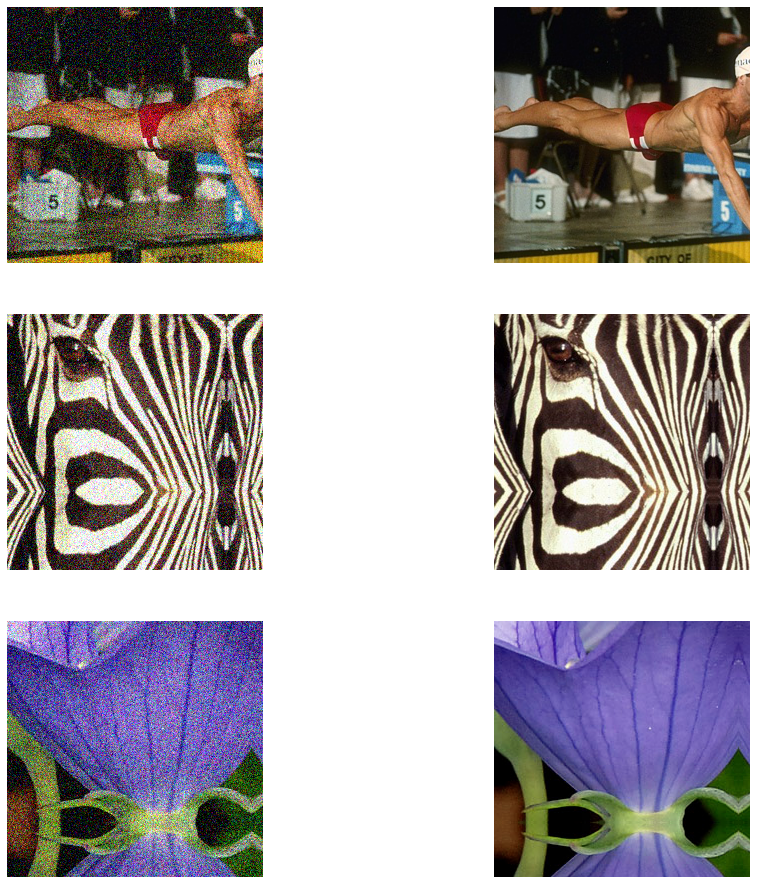

In [172]:
# sample a few images from the train dataset
fig, ax = plt.subplots(3, 2, figsize=(16, 16))
for ii in range(3):
    noisy, clean = vsdr_train_ds[ii]
    # go back to uint8
    ax[ii, 0].axis("off")
    ax[ii, 0].imshow(to_display(noisy))
    ax[ii, 1].axis("off")
    ax[ii, 1].imshow(to_display(clean))
plt.show()

In [173]:
# train the denoising network
n_epochs = 10
logger = SummaryWriter("runs/noise2noise-1")
train_loader = DataLoader(vsdr_train_ds, batch_size=1, shuffle=True) 
val_loader = DataLoader(vsdr_val_ds, batch_size=1)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
metric = PSNR()
run_training(model, train_loader, val_loader, loss, metric, optimizer, n_epochs)#, logger)

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 0


 10%|█         | 1/10 [00:34<05:11, 34.58s/it]

MSELoss: 0.027616874505885135 	Metric: 19.44548018164
Epoch: 1


 20%|██        | 2/10 [01:09<04:36, 34.55s/it]

MSELoss: 0.012729556060945377 	Metric: 21.97173721967985
Epoch: 2


 30%|███       | 3/10 [01:43<04:01, 34.55s/it]

MSELoss: 0.015360966539726807 	Metric: 21.302963697320006
Epoch: 3


 40%|████      | 4/10 [02:18<03:26, 34.50s/it]

MSELoss: 0.012178078460960817 	Metric: 22.267061772692575
Epoch: 4


 50%|█████     | 5/10 [02:52<02:52, 34.60s/it]

MSELoss: 0.010578488143017659 	Metric: 22.788450597512007
Epoch: 5


 60%|██████    | 6/10 [03:27<02:18, 34.54s/it]

MSELoss: 0.018544594160257243 	Metric: 20.94651478779549
Epoch: 6


 70%|███████   | 7/10 [04:01<01:43, 34.54s/it]

MSELoss: 0.012256143387789145 	Metric: 22.216345314351866
Epoch: 7


 80%|████████  | 8/10 [04:36<01:08, 34.50s/it]

MSELoss: 0.013167858470040254 	Metric: 21.84501924556842
Epoch: 8


 90%|█████████ | 9/10 [05:10<00:34, 34.46s/it]

MSELoss: 0.013433949735302191 	Metric: 22.22081813103379
Epoch: 9


100%|██████████| 10/10 [05:45<00:00, 34.51s/it]

MSELoss: 0.011380714865831228 	Metric: 22.48194985981153


In [219]:
# create the test dataset
vsdr_test_ds = VsdrDataset(
    vsdr_test,
    noise_transform=lambda x: (additive_gaussian_noise(x, var=0.1),x)
)

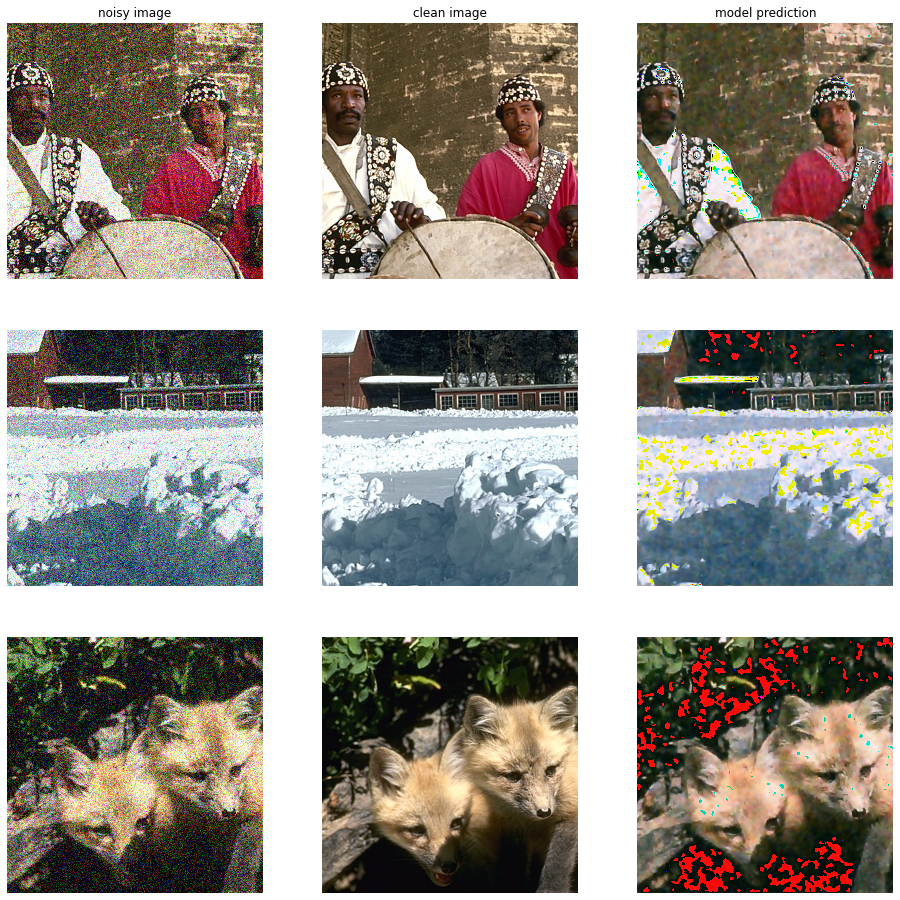

In [175]:
# TODO display some results on the test data
model.eval()
fig, ax = plt.subplots(3, 3, figsize=(16, 16))
ax[0,0].set_title("noisy image")
ax[0,1].set_title("clean image")
ax[0,2].set_title("model prediction")
for ii in range(3):
    noisy, clean = vsdr_test_ds[ii]
    # go back to uint8
    ax[ii, 0].axis("off")
    ax[ii, 0].imshow(to_display(noisy))
    ax[ii, 1].axis("off")
    ax[ii, 1].imshow(to_display(clean))
    pred = model(torch.tensor(noisy).to(device, dtype=torch.float))
    ax[ii, 2].axis("off")
    ax[ii, 2].imshow(to_display(pred.cpu().detach().numpy()))    
plt.show()

## Train a network with noisy targets (Gaussian noise)

Now, we train a network from noisy inputs AND noisy targets. And compare its results to the previous denoising network learned on clean targets.

QUESTION:
- Why can the model learn denoising even though we also have a noisy target?

TODO your answer here
- It also works, because with this approach it also has to learn how to keep the content for reconstruction, while "changing" the noise
- Note: With that approach it should be a different realization of the noise and/or different kind of noise, otherwise it could overfit the kind of noise.

In [176]:
# instantiate new model and loss
model = UNet(in_channels=3, out_channels=3)
model.to(device)
loss = nn.MSELoss()
loss.to(device)

MSELoss()

In [177]:
DS = VsdrDataset(vsdr_train, lambda x: (additive_gaussian_noise(x,0.1),additive_gaussian_noise(x,0.1)))
train_size = int(0.9 * len(DS))
val_size = len(DS) - train_size
train_dataset, val_dataset = torch.utils.data.random_split(DS, [train_size, val_size])

In [178]:
# TODO create dataset with corrupted input and target
# use same variance as before (0.1)
vsdr_train_ds = train_dataset
vsdr_val_ds = val_dataset
vsdr_test_ds = VsdrDataset(
    vsdr_test,
    noise_transform=lambda x: (additive_gaussian_noise(x,0.1),additive_gaussian_noise(x,0.1))
)

In [179]:
# train the model
n_epochs = 10
train_loader = DataLoader(vsdr_train_ds, batch_size=1, shuffle=True) 
val_loader = DataLoader(vsdr_val_ds, batch_size=1)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
metric = PSNR()
run_training(model, train_loader, val_loader, loss, metric, optimizer, n_epochs)

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 0


 10%|█         | 1/10 [00:36<05:28, 36.51s/it]

MSELoss: 0.09816524883111317 	Metric: 12.988052769075157
Epoch: 1


 20%|██        | 2/10 [01:13<04:52, 36.58s/it]

MSELoss: 0.09518107962914002 	Metric: 13.039164459535767
Epoch: 2


 30%|███       | 3/10 [01:49<04:15, 36.47s/it]

MSELoss: 0.09796224668239936 	Metric: 12.905802401030373
Epoch: 3


 40%|████      | 4/10 [02:25<03:38, 36.38s/it]

MSELoss: 0.09660907376271027 	Metric: 13.065895850758526
Epoch: 4


 50%|█████     | 5/10 [03:01<03:01, 36.27s/it]

MSELoss: 0.09420037766297658 	Metric: 13.181095530868175
Epoch: 5


 60%|██████    | 6/10 [03:37<02:24, 36.19s/it]

MSELoss: 0.10217624100355002 	Metric: 12.732729616356261
Epoch: 6


 70%|███████   | 7/10 [04:13<01:48, 36.16s/it]

MSELoss: 0.09506278676100266 	Metric: 13.251776004347516
Epoch: 7


 80%|████████  | 8/10 [04:50<01:12, 36.23s/it]

MSELoss: 0.09324144915892528 	Metric: 13.094872139776543
Epoch: 8


 90%|█████████ | 9/10 [05:26<00:36, 36.16s/it]

MSELoss: 0.09342159980382675 	Metric: 13.146700470247902
Epoch: 9


100%|██████████| 10/10 [06:02<00:00, 36.22s/it]

MSELoss: 0.09352704653373131 	Metric: 13.07384388321095


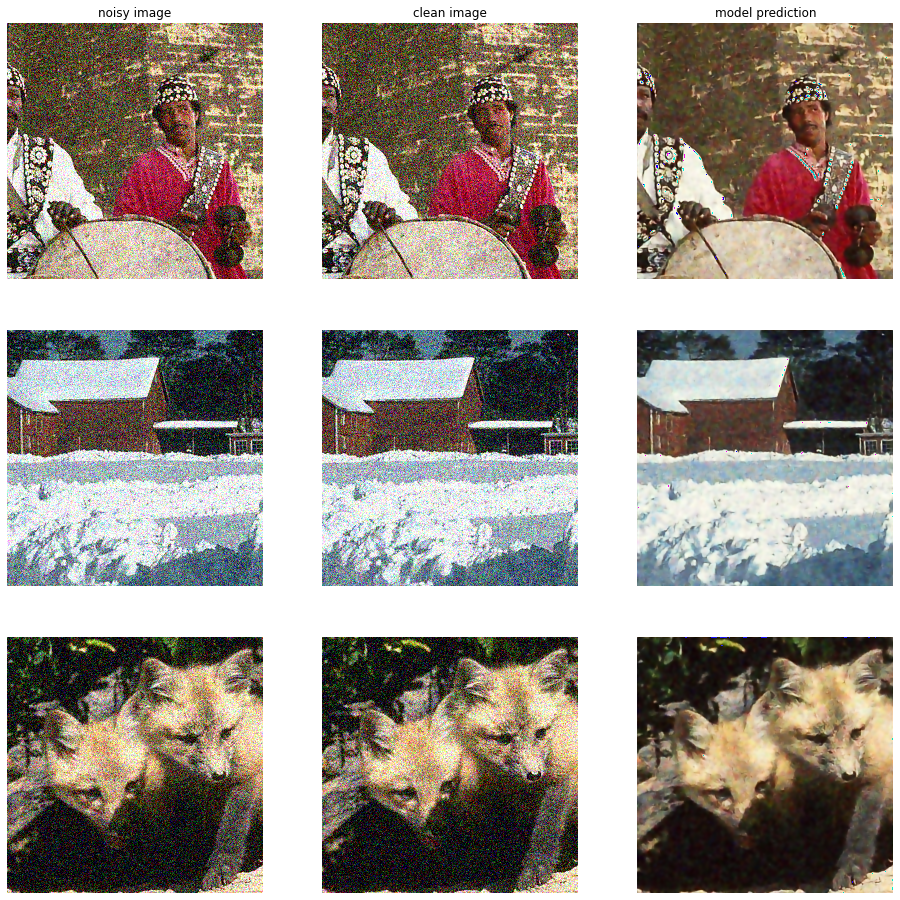

In [180]:
# TODO show a few predictions for the test dataset
model.eval()
fig, ax = plt.subplots(3, 3, figsize=(16, 16))
ax[0,0].set_title("noisy image")
ax[0,1].set_title("clean image")
ax[0,2].set_title("model prediction")
for ii in range(3):
    noisy, clean = vsdr_test_ds[ii]
    # go back to uint8
    ax[ii, 0].axis("off")
    ax[ii, 0].imshow(to_display(noisy))
    ax[ii, 1].axis("off")
    ax[ii, 1].imshow(to_display(clean))
    pred = model(torch.tensor(noisy).to(device, dtype=torch.float))
    ax[ii, 2].axis("off")
    ax[ii, 2].imshow(to_display(pred.cpu().detach().numpy()))    
plt.show()


In [181]:
# TODO compute the PSNR for the whole test dataset
test_loader = DataLoader(vsdr_test_ds, batch_size=1)
validate(model, test_loader, loss, metric)

MSELoss: 0.09332029786828445 	Metric: 13.248800997577549


QUESTIONS:
- Compare the result between the network trained with clean targets and with noisy targets.

TODO your answer here
- with that approach(noise2noise) the reconstruction better with less artifacts.

# Attemt to have higher to lower noise, not same

In [182]:
model = UNet(in_channels=3, out_channels=3)
model.to(device)
loss = nn.MSELoss()
loss.to(device)
DS = VsdrDataset(vsdr_train, lambda x: (additive_gaussian_noise(x,0.3),additive_gaussian_noise(x,0.1)))
train_size = int(0.9 * len(DS))
val_size = len(DS) - train_size
train_dataset, val_dataset = torch.utils.data.random_split(DS, [train_size, val_size])
vsdr_train_ds = train_dataset
vsdr_val_ds = val_dataset
n_epochs = 3
train_loader = DataLoader(vsdr_train_ds, batch_size=1, shuffle=True) 
val_loader = DataLoader(vsdr_val_ds, batch_size=1)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
metric = PSNR()
run_training(model, train_loader, val_loader, loss, metric, optimizer, n_epochs)

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 0


 33%|███▎      | 1/3 [00:36<01:13, 36.54s/it]

MSELoss: 0.12174997402307315 	Metric: 12.16292995775581
Epoch: 1


 67%|██████▋   | 2/3 [01:13<00:36, 36.55s/it]

MSELoss: 0.11687262241656964 	Metric: 12.185076777544325
Epoch: 2


100%|██████████| 3/3 [01:49<00:00, 36.46s/it]

MSELoss: 0.11385378967493008 	Metric: 12.463103310996965


In [183]:
vsdr_test_ds = VsdrDataset(
    vsdr_test,
    noise_transform=lambda x: (additive_gaussian_noise(x,0.3),x)
)

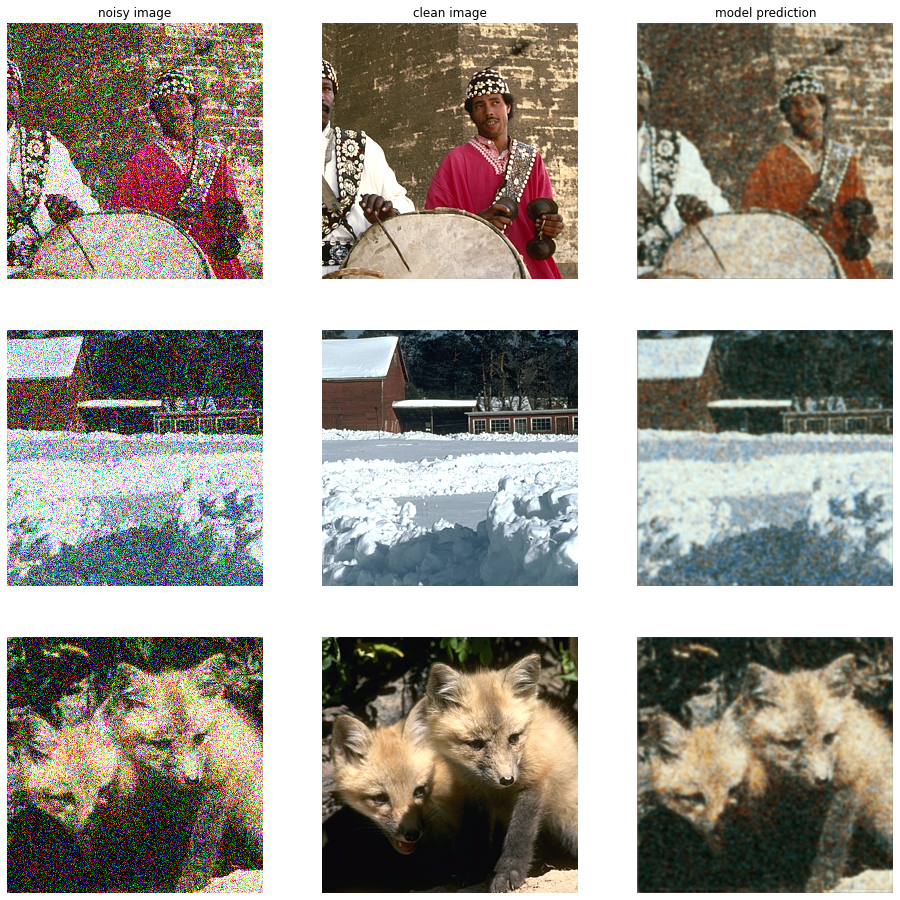

In [184]:
model.eval()
fig, ax = plt.subplots(3, 3, figsize=(16, 16))
ax[0,0].set_title("noisy image")
ax[0,1].set_title("clean image")
ax[0,2].set_title("model prediction")
for ii in range(3):
    noisy, clean = vsdr_test_ds[ii]
    # go back to uint8
    ax[ii, 0].axis("off")
    ax[ii, 0].imshow(to_display(noisy))
    ax[ii, 1].axis("off")
    ax[ii, 1].imshow(to_display(clean))
    pred = model(torch.tensor(noisy).to(device, dtype=torch.float))
    ax[ii, 2].axis("off")
    ax[ii, 2].imshow(to_display(pred.cpu().detach().numpy()))    
plt.show()

## [Optional] Train a network with noisy targets (Poisson noise)

Use poisson noise instead of gaussian noise and compare to both the network trained with clean target and the network with the target corrupted by gaussian noise.

In [185]:
def additive_poisson_noise(x, var):
    added_gauss = random_noise(x,mode='poisson')
    return added_gauss

In [186]:
# TODO run training with poisson noise and compare with previous results
model = UNet(in_channels=3, out_channels=3)
model.to(device)
loss = nn.MSELoss()
loss.to(device)
DS = VsdrDataset(vsdr_train, lambda x: (additive_poisson_noise(x,0.1),additive_poisson_noise(x,0.1)))
train_size = int(0.9 * len(DS))
val_size = len(DS) - train_size
train_dataset, val_dataset = torch.utils.data.random_split(DS, [train_size, val_size])
vsdr_train_ds = train_dataset
vsdr_val_ds = val_dataset
n_epochs = 4
train_loader = DataLoader(vsdr_train_ds, batch_size=1, shuffle=True) 
val_loader = DataLoader(vsdr_val_ds, batch_size=1)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
metric = PSNR()
run_training(model, train_loader, val_loader, loss, metric, optimizer, n_epochs)

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 0


 25%|██▌       | 1/4 [00:51<02:34, 51.54s/it]

MSELoss: 0.012406305027886843 	Metric: 22.3024688354424
Epoch: 1


 50%|█████     | 2/4 [01:43<01:43, 51.70s/it]

MSELoss: 0.01970122860243114 	Metric: 20.94089375538467
Epoch: 2


 75%|███████▌  | 3/4 [02:34<00:51, 51.61s/it]

MSELoss: 0.006611293671318354 	Metric: 25.233962069498634
Epoch: 3


100%|██████████| 4/4 [03:26<00:00, 51.68s/it]

MSELoss: 0.027703352379970826 	Metric: 19.120092391232596


In [221]:
vsdr_test_ds = VsdrDataset(
    vsdr_test,
    noise_transform=lambda x: (additive_poisson_noise(x,0.1),x)
)

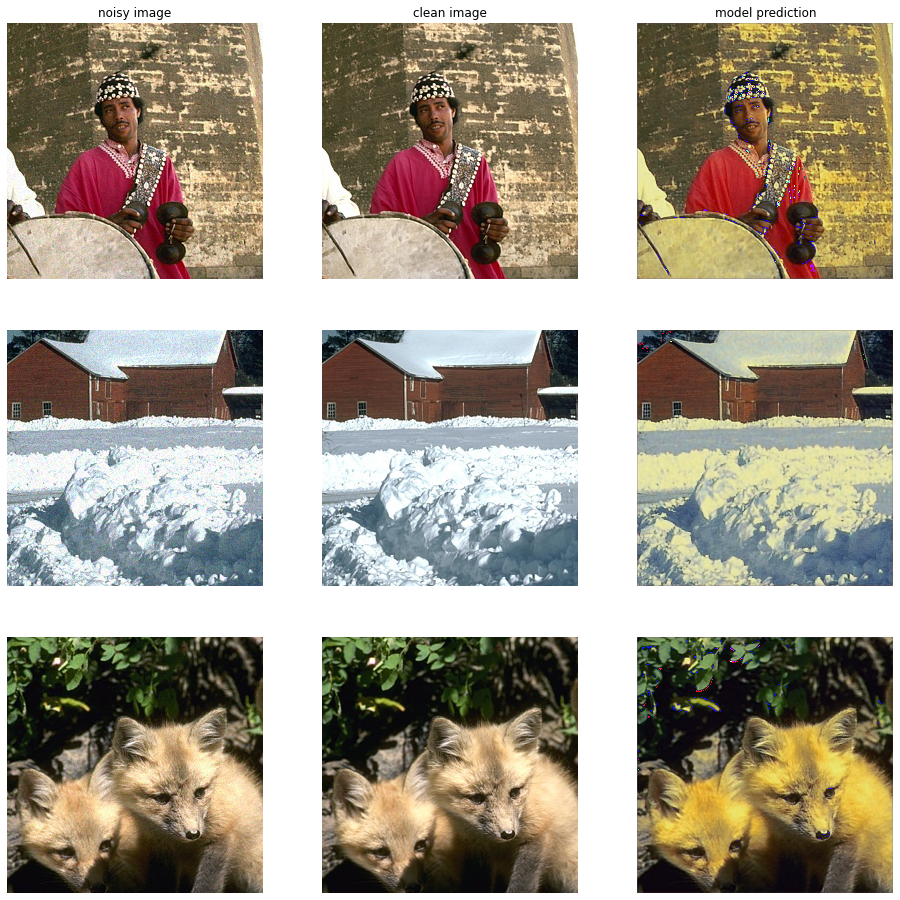

In [188]:
model.eval()
fig, ax = plt.subplots(3, 3, figsize=(16, 16))
ax[0,0].set_title("noisy image")
ax[0,1].set_title("clean image")
ax[0,2].set_title("model prediction")
for ii in range(3):
    noisy, clean = vsdr_test_ds[ii]
    # go back to uint8
    ax[ii, 0].axis("off")
    ax[ii, 0].imshow(to_display(noisy))
    ax[ii, 1].axis("off")
    ax[ii, 1].imshow(to_display(clean))
    pred = model(torch.tensor(noisy).to(device, dtype=torch.float))
    ax[ii, 2].axis("off")
    ax[ii, 2].imshow(to_display(pred.cpu().detach().numpy()))    
plt.show()

## [Optional] Use U-Net with BatchNorm

Repeat the exercise with a U-Net with BatchNorm. Does this improve the results?

In [244]:
# TODO use a U-Net architecture with BatchNorm and compare with previous results
model = UNet(in_channels=3, out_channels=3,batch_norm=True)
model.to(device)
loss = nn.MSELoss()
loss.to(device)
DS = VsdrDataset(vsdr_train, lambda x: (additive_gaussian_noise(x,0.1),additive_gaussian_noise(x,0.1)))
train_size = int(0.9 * len(DS))
val_size = len(DS) - train_size
train_dataset, val_dataset = torch.utils.data.random_split(DS, [train_size, val_size])
vsdr_train_ds = train_dataset
vsdr_val_ds = val_dataset
n_epochs = 3
train_loader = DataLoader(vsdr_train_ds, batch_size=1, shuffle=True) 
val_loader = DataLoader(vsdr_val_ds, batch_size=1)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
metric = PSNR()
run_training(model, train_loader, val_loader, loss, metric, optimizer, n_epochs)

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch: 0


 33%|███▎      | 1/3 [00:40<01:20, 40.29s/it]

MSELoss: 0.1654362399608661 	Metric: 11.424636856325117
Epoch: 1


 67%|██████▋   | 2/3 [01:20<00:40, 40.15s/it]

MSELoss: 0.10407040745784076 	Metric: 13.118768626737047
Epoch: 2


100%|██████████| 3/3 [02:00<00:00, 40.12s/it]

MSELoss: 0.10275027576165321 	Metric: 13.29123827505322


In [245]:
vsdr_train_ds = train_dataset
vsdr_val_ds = val_dataset
vsdr_test_ds = VsdrDataset(
    vsdr_test,
    noise_transform=lambda x: (additive_gaussian_noise(x,0.1),x)
)

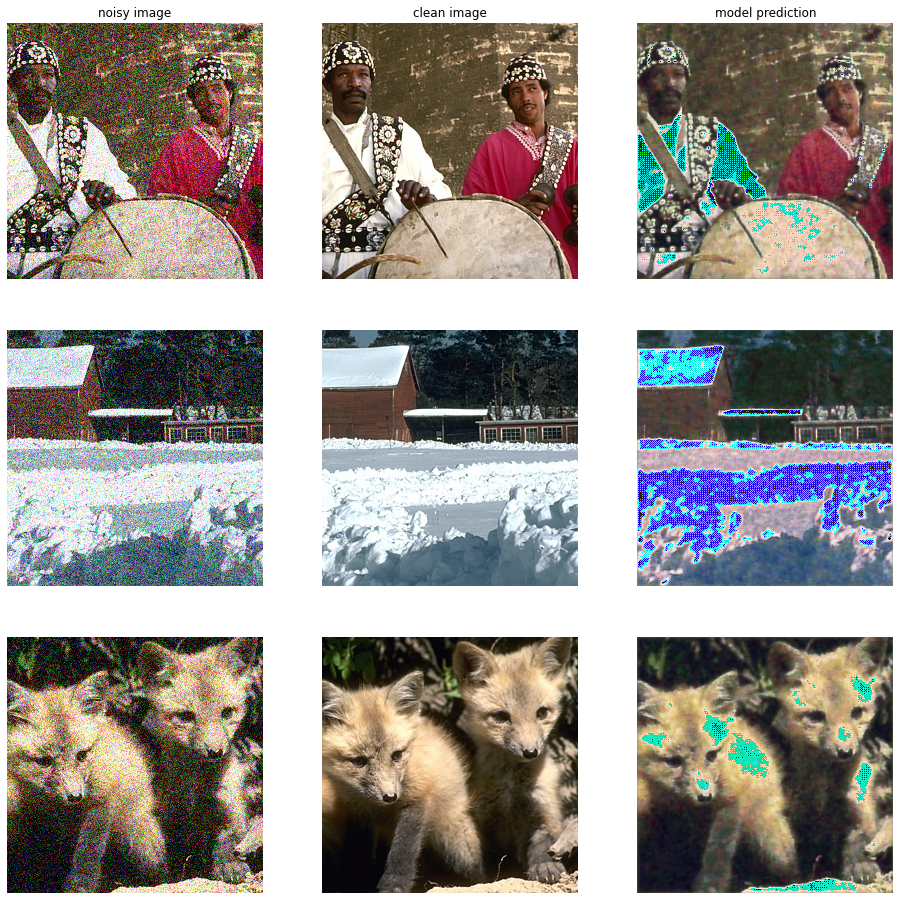

In [246]:
model.eval()
fig, ax = plt.subplots(3, 3, figsize=(16, 16))
ax[0,0].set_title("noisy image")
ax[0,1].set_title("clean image")
ax[0,2].set_title("model prediction")
for ii in range(3):
    noisy, clean = vsdr_test_ds[ii]
    # go back to uint8
    ax[ii, 0].axis("off")
    ax[ii, 0].imshow(to_display(noisy))
    ax[ii, 1].axis("off")
    ax[ii, 1].imshow(to_display(clean))
    noisy = noisy[None, :]
    pred = model(torch.tensor(noisy).to(device, dtype=torch.float))
    ax[ii, 2].axis("off")
    ax[ii, 2].imshow(to_display(pred[0].cpu().detach().numpy()))    
plt.show()